##### Copyright 2018 The TensorFlow Hub Authors.

Licensed under the Apache License, Version 2.0 (the "License");

In [ ]:
# Copyright 2018 The TensorFlow Hub Authors. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# ==============================================================================

# How to match images using DELF and TensorFlow Hub


<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/hub/tutorials/tf_hub_delf_module"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/hub/blob/master/examples/colab/tf_hub_delf_module.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/hub/blob/master/examples/colab/tf_hub_delf_module.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/hub/examples/colab/tf_hub_delf_module.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

TensorFlow Hub (TF-Hub) is a platform to share machine learning expertise packaged in reusable resources, notably pre-trained **modules**.

In this colab, we will use a module that packages the [DELF](https://github.com/tensorflow/models/tree/master/research/delf) neural network and logic for processing images to identify keypoints and their descriptors. The weights of the neural network were trained on images of landmarks as described in [this paper](https://arxiv.org/abs/1612.06321).

## Setup

In [1]:
from absl import logging

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageOps
from scipy.spatial import cKDTree
from skimage.feature import plot_matches
from skimage.measure import ransac
from skimage.transform import AffineTransform
from six import BytesIO

import tensorflow as tf
import gzip
import pickle
import tensorflow_hub as hub
from six.moves.urllib.request import urlopen

In [2]:
gpu = tf.config.experimental.list_physical_devices('GPU')
print(gpu)
if gpu:
    try:
        tf.config.experimental.set_virtual_device_configuration(
        gpu[0],
        [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=1024)])
        print(len(gpu), "Physical GPUs")
    except RuntimeError as e:
      # Memory growth must be set before GPUs have been initialized
      print(e)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
1 Physical GPUs


## The data

In the next cell, we specify the URLs of two images we would like to process with DELF in order to match and compare them.

In [3]:
delf = hub.load('https://tfhub.dev/google/delf/1').signatures['default']

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Download, resize, save and display the images.

In [4]:
def download_and_resize(name, url, new_width=256, new_height=256):
#     path = tf.keras.utils.get_file(url.split('/')[-1], url)
    image = Image.open(url)
    image = ImageOps.fit(image, (new_width, new_height), Image.ANTIALIAS)
    return image

In [5]:
!pwd

/cygdrive/c/Apps/jupyterWorkspace/google_landmark_detection


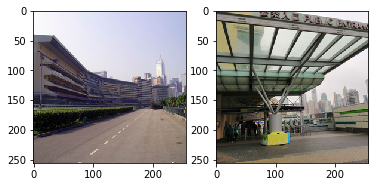

In [6]:
IMAGE_1_URL = "datasets\\raw_data\\train\\0\\09ed156ffac3e70c.jpg"
IMAGE_2_URL = "datasets\\raw_data\\train\\0\\26e829f30f657d0c.jpg"
# IMAGE_2_URL = "datasets\\raw_data\\train\\0\\09ed156ffac3e70c.jpg"

image1 = download_and_resize('image_1.jpg', IMAGE_1_URL)
image2 = download_and_resize('image_2.jpg', IMAGE_2_URL)

plt.subplot(1,2,1)
plt.imshow(image1)
plt.subplot(1,2,2)
plt.imshow(image2)

## Apply the DELF module to the data

The DELF module takes an image as input and will describe noteworthy points with vectors. The following cell contains the core of this colab's logic.

In [7]:
def run_delf(image):
    np_image = np.array(image)
    float_image = tf.image.convert_image_dtype(np_image, tf.float32)

    return delf(
        image=float_image,
        score_threshold=tf.constant(100.0),
        image_scales=tf.constant([0.25, 0.3536, 0.5, 0.7071, 1.0, 1.4142, 2.0]),
        max_feature_num=tf.constant(1000))

In [8]:
result1 = run_delf(image1)
result2 = run_delf(image2)

In [9]:
print(type(result1))
print(result1.keys())
print(result1['locations'])
print(result1)

<class 'dict'>
dict_keys(['scores', 'features', 'scales', 'locations', 'boxes', 'attention', 'descriptors'])
tf.Tensor(
[[ 96.       208.      ]
 [ 90.51054  203.64871 ]
 [ 80.       208.      ]
 [ 90.49774   90.49774 ]
 [128.       128.      ]
 [ 90.49774    0.      ]
 [ 90.510544  45.255264]
 [ 96.       224.      ]
 [112.       240.      ]
 [128.        64.      ]
 [ 90.510544 226.27635 ]
 [128.       192.      ]
 [128.         0.      ]
 [ 90.49774  180.99548 ]
 [ 64.       192.      ]
 [176.       240.      ]
 [ 96.        64.      ]
 [ 96.       192.      ]
 [135.76581  181.02107 ]
 [180.99548  180.99548 ]
 [160.       240.      ]
 [135.76581  135.76581 ]
 [128.       128.      ]
 [ 96.        32.      ]
 [128.       240.      ]
 [ 96.       112.      ]
 [ 90.51054   67.882904]
 [112.       112.      ]
 [128.       224.      ]
 [128.        96.      ]
 [135.76581  226.27635 ]
 [180.99548   90.49774 ]
 [ 90.510544 181.02107 ]
 [128.       192.      ]
 [135.76581  181.02109 ]
 [128

In [10]:
proto_tensor_result1_locations = tf.make_tensor_proto(result1['locations'])
proto_tensor_result2_locations = tf.make_tensor_proto(result2['locations'])

proto_tensor_result1_descriptors = tf.make_tensor_proto(result1['descriptors'])
proto_tensor_result2_descriptors = tf.make_tensor_proto(result2['descriptors'])

result1_locations_ndarray = tf.make_ndarray(proto_tensor_result1_locations)
result2_locations_ndarray = tf.make_ndarray(proto_tensor_result2_locations)

result1_descriptors_ndarray = tf.make_ndarray(proto_tensor_result1_descriptors)
result2_descriptors_ndarray = tf.make_ndarray(proto_tensor_result2_descriptors)

result1_np_dict = {}
result2_np_dict = {}

result1_np_dict['locations'] = result1_locations_ndarray
result2_np_dict['locations'] = result2_locations_ndarray

result1_np_dict['descriptors'] = result1_descriptors_ndarray
result2_np_dict['descriptors'] = result2_descriptors_ndarray

print(type(result1_locations_ndarray))
print(result1_locations_ndarray.shape[0])
print(result1_locations_ndarray)

<class 'numpy.ndarray'>
143
[[ 96.       208.      ]
 [ 90.51054  203.64871 ]
 [ 80.       208.      ]
 [ 90.49774   90.49774 ]
 [128.       128.      ]
 [ 90.49774    0.      ]
 [ 90.510544  45.255264]
 [ 96.       224.      ]
 [112.       240.      ]
 [128.        64.      ]
 [ 90.510544 226.27635 ]
 [128.       192.      ]
 [128.         0.      ]
 [ 90.49774  180.99548 ]
 [ 64.       192.      ]
 [176.       240.      ]
 [ 96.        64.      ]
 [ 96.       192.      ]
 [135.76581  181.02107 ]
 [180.99548  180.99548 ]
 [160.       240.      ]
 [135.76581  135.76581 ]
 [128.       128.      ]
 [ 96.        32.      ]
 [128.       240.      ]
 [ 96.       112.      ]
 [ 90.51054   67.882904]
 [112.       112.      ]
 [128.       224.      ]
 [128.        96.      ]
 [135.76581  226.27635 ]
 [180.99548   90.49774 ]
 [ 90.510544 181.02107 ]
 [128.       192.      ]
 [135.76581  181.02109 ]
 [128.        64.      ]
 [112.        96.      ]
 [113.138176 248.90399 ]
 [128.       128.     

## Use the locations and description vectors to match the images

In [15]:
#@title TensorFlow is not needed for this post-processing and visualization
def match_images(image1, image2, result1, result2):
    
    distance_threshold = 0.8

    # Read features.
    num_features_1 = result1['locations'].shape[0]
#     print("Loaded image 1's %d features" % num_features_1)

    num_features_2 = result2['locations'].shape[0]
#     print("Loaded image 2's %d features" % num_features_2)

    sum_inliers = 0
    try:
    # Find nearest-neighbor matches using a KD tree.
        d1_tree = cKDTree(result1['descriptors'])
        _, indices = d1_tree.query(
            result2['descriptors'],
            distance_upper_bound=distance_threshold)

        # Select feature locations for putative matches.
        locations_2_to_use = np.array([
            result2['locations'][i,]
            for i in range(num_features_2)
            if indices[i] != num_features_1
        ])
        locations_1_to_use = np.array([
            result1['locations'][indices[i],]
            for i in range(num_features_2)
            if indices[i] != num_features_1
        ])

    # Perform geometric verification using RANSAC.
    
        _, inliers = ransac(
            (locations_1_to_use, locations_2_to_use),
            AffineTransform,
            min_samples=3,
            residual_threshold=20,
            max_trials=1000)
        # Visualize correspondences.
        _, ax = plt.subplots()
        inlier_idxs = np.nonzero(inliers)[0]
        plot_matches(
            ax,
            image1,
            image2,
            locations_1_to_use,
            locations_2_to_use,
            np.column_stack((inlier_idxs, inlier_idxs)),
            matches_color='b')
        ax.axis('off')
        ax.set_title('DELF correspondences')
        plt.show()
        plt.close()
        
        sum_inliers = sum(inliers)
        print('Found %d inliers' % sum(inliers))
    except:
        sum_inliers = 0
    return sum_inliers

Loaded image 1's 143 features
Loaded image 2's 131 features


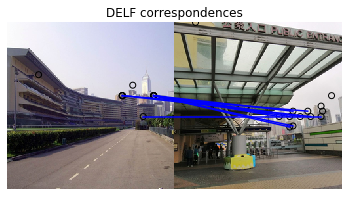

Found 9 inliers


In [13]:
match_images(image1, image2, result1, result2)

Loaded image 1's 143 features
Loaded image 2's 131 features
Found 9 inliers


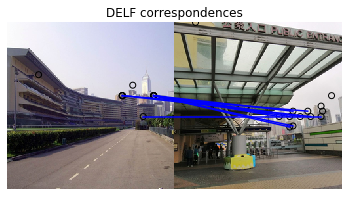

In [13]:
match_images(image1, image2, result1_np_dict, result2_np_dict)

In [2]:
landmark_id = 177870
filename = "landmark_ids_delf_features_dict_pickle_files\\{}.pkl.gz".format(landmark_id)
with gzip.open(filename,'rb') as f:
     landmark_ids_results_dict = pickle.load(f)
print(len(landmark_ids_results_dict))
print(list(landmark_ids_results_dict.keys()))
print(len(landmark_ids_results_dict[landmark_id]))
print(landmark_ids_results_dict)

1
[177870]
500
{177870: [{'locations': array([[240.      ,   0.      ],
       [ 32.      , 224.      ],
       [ 16.      , 240.      ],
       [224.      ,  32.      ],
       [ 32.      , 240.      ],
       [ 90.51054 ,   0.      ],
       [240.      , 160.      ],
       [ 45.255264, 226.27635 ],
       [248.90399 ,  67.882904]], dtype=float32), 'descriptors': array([[ 1.48597881e-01, -3.58392037e-02, -1.21899776e-01,
        -1.86202154e-01, -2.71297712e-02, -3.54816839e-02,
        -4.03299145e-02, -7.62504190e-02, -1.33471444e-01,
         1.84990704e-01, -2.72398889e-01,  4.82967384e-02,
        -2.93049663e-01,  3.78010362e-01, -2.88409349e-02,
         2.83388793e-01,  3.75699788e-01, -7.89024606e-02,
        -7.21395761e-02, -9.78576243e-02, -3.71259265e-02,
         3.24220747e-01, -2.47455817e-02, -6.84538996e-03,
        -6.72551394e-02, -9.98965725e-02, -9.70296785e-02,
        -7.98313618e-02,  6.59641698e-02, -9.98013020e-02,
        -4.45939042e-02,  1.10246497e-03, 

In [24]:
result3 = landmark_ids_results_dict[landmark_id][4]
result4 = landmark_ids_results_dict[landmark_id][1]

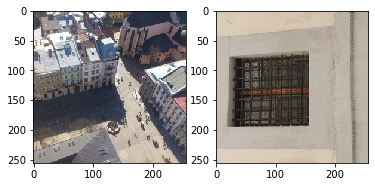

In [32]:
IMAGE_3_URL = "datasets\\raw_data\\train\\{}\\{}.jpg".format(landmark_id, result3['image_id'])
IMAGE_4_URL = "datasets\\raw_data\\train\\{}\\{}.jpg".format(landmark_id, result4['image_id'])

image3 = download_and_resize('image_3.jpg', IMAGE_3_URL)
image4 = download_and_resize('image_4.jpg', IMAGE_4_URL)

plt.subplot(1,2,1)
plt.imshow(image3)
plt.subplot(1,2,2)
plt.imshow(image4)

In [33]:
match_images(image3, image4, result3, result4)

Loaded image 1's 186 features
Loaded image 2's 69 features


TypeError: 'int' object is not iterable

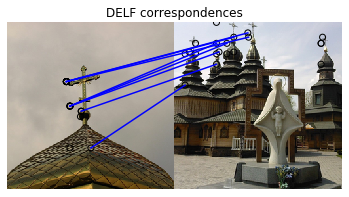

Found 8 inliers


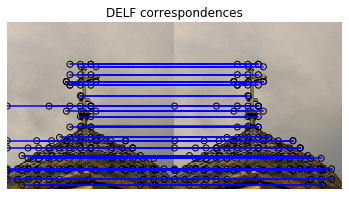

Found 139 inliers


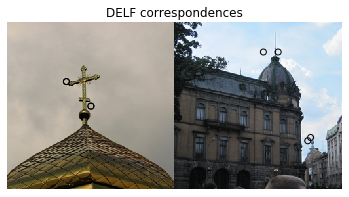

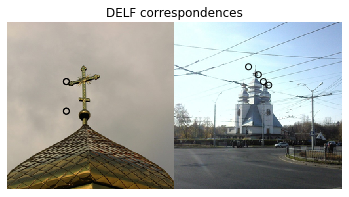

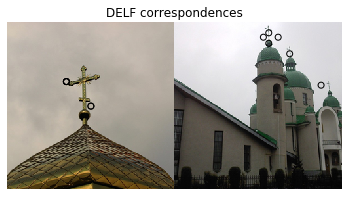

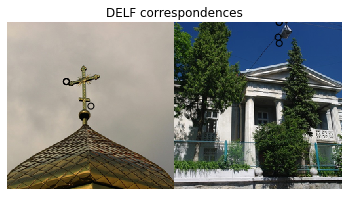

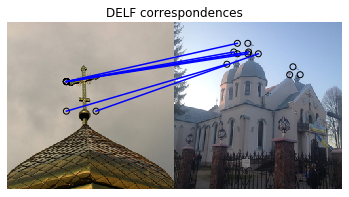

Found 7 inliers


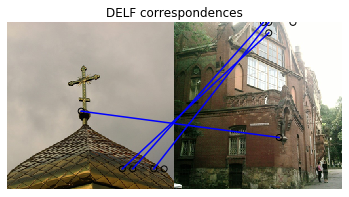

Found 4 inliers


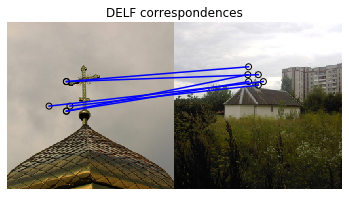

Found 6 inliers


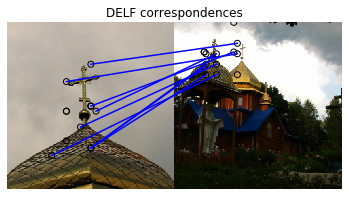

Found 9 inliers


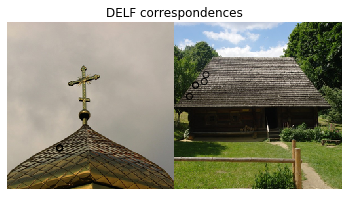

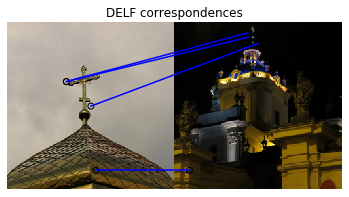

Found 4 inliers


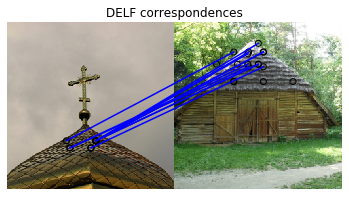

Found 11 inliers


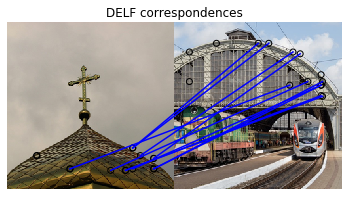

Found 11 inliers


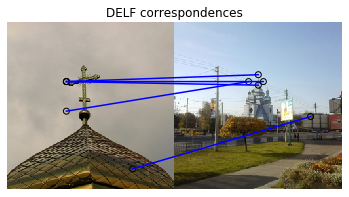

Found 5 inliers


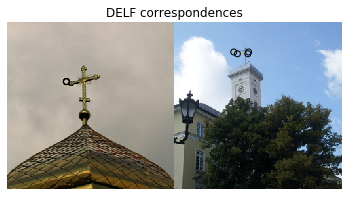

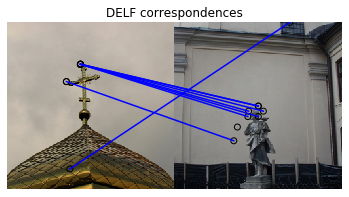

Found 8 inliers


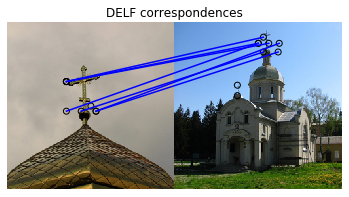

Found 7 inliers


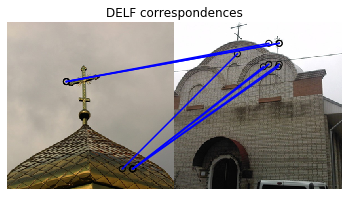

Found 8 inliers


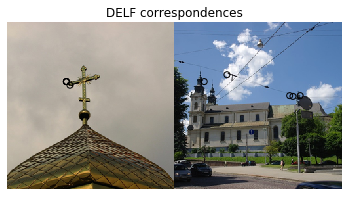

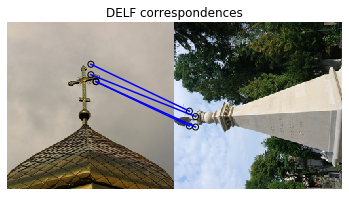

Found 4 inliers


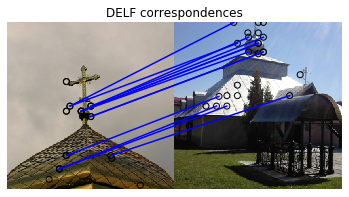

Found 13 inliers


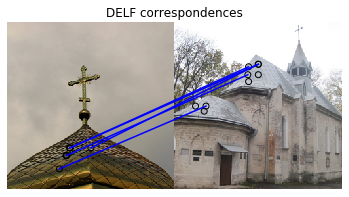

Found 5 inliers


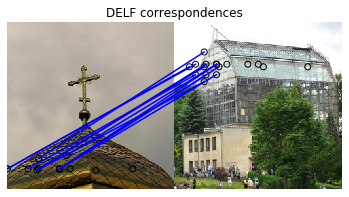

Found 12 inliers


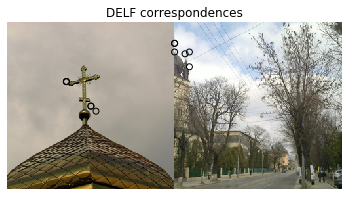

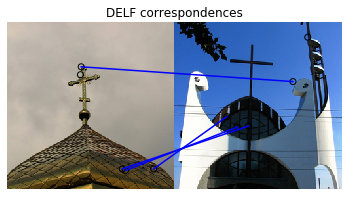

Found 4 inliers


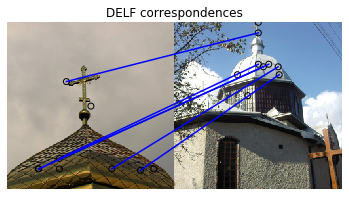

Found 6 inliers


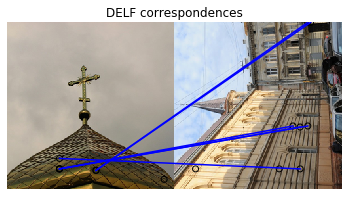

Found 6 inliers


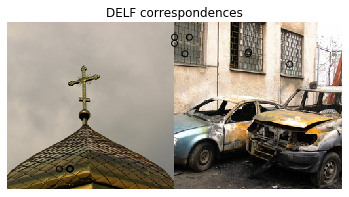

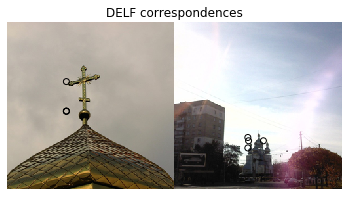

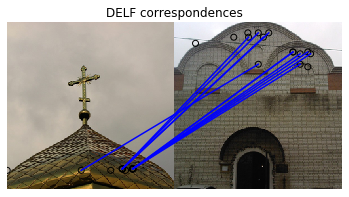

Found 11 inliers


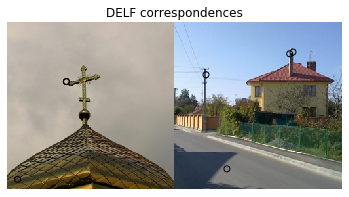

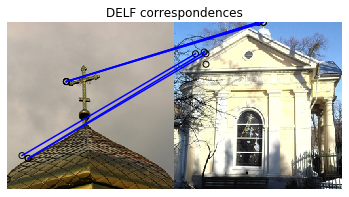

Found 7 inliers


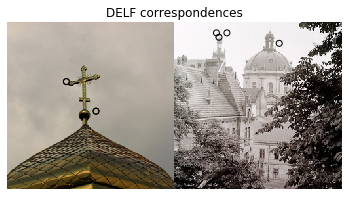

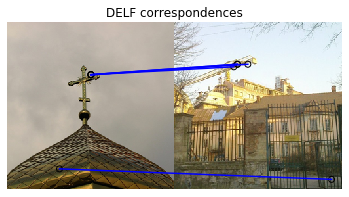

Found 5 inliers


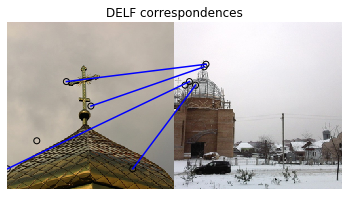

Found 4 inliers


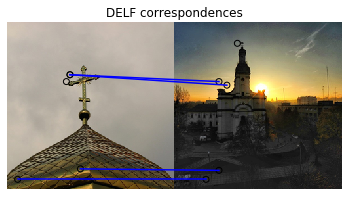

Found 4 inliers


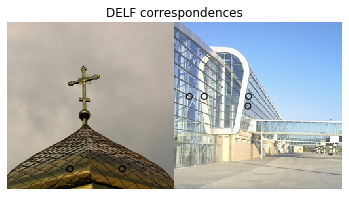

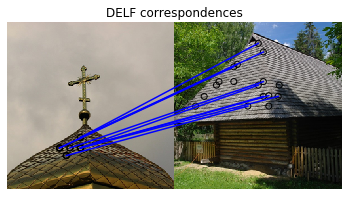

Found 10 inliers


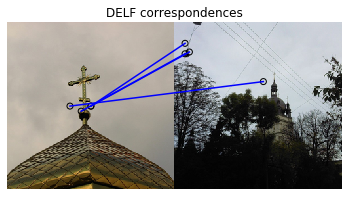

Found 4 inliers


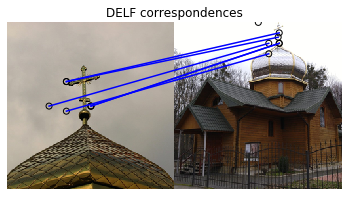

Found 6 inliers


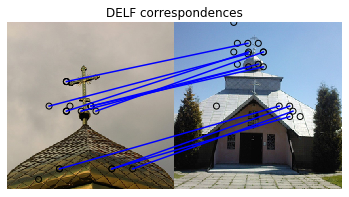

Found 11 inliers


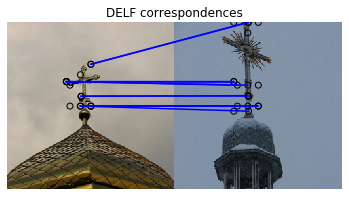

Found 12 inliers


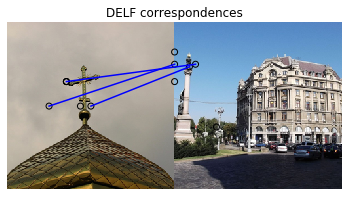

Found 3 inliers


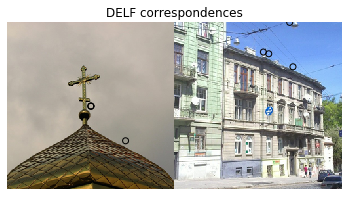

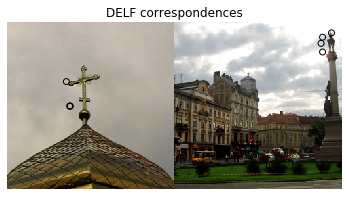

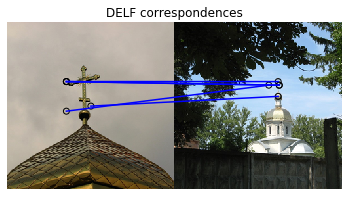

Found 5 inliers


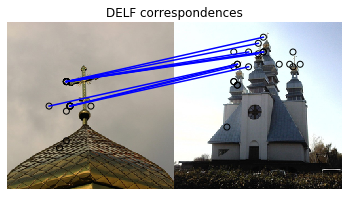

Found 10 inliers


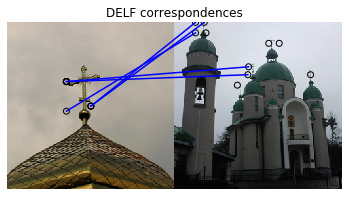

Found 5 inliers


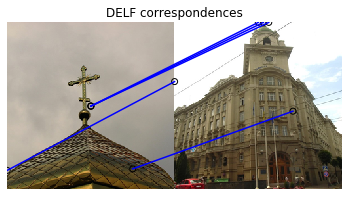

Found 5 inliers


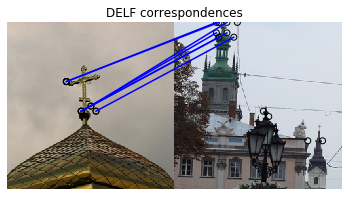

Found 7 inliers


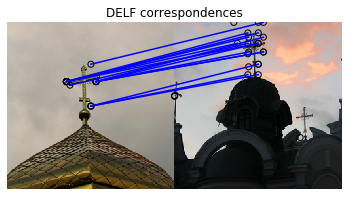

Found 15 inliers


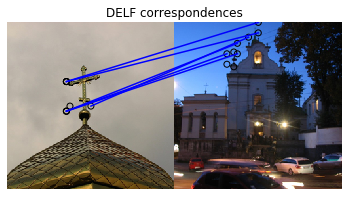

Found 6 inliers


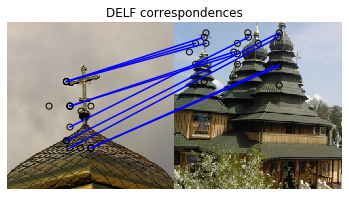

Found 10 inliers


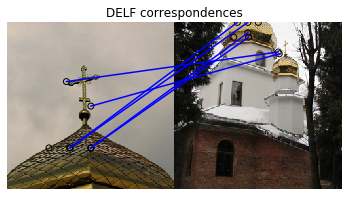

Found 6 inliers


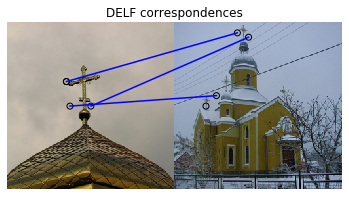

Found 3 inliers


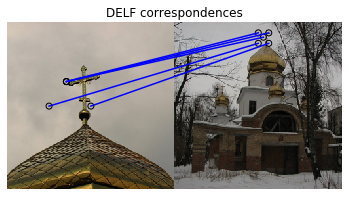

Found 5 inliers


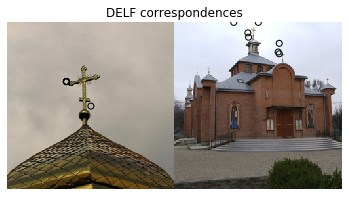

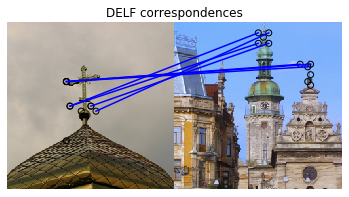

Found 7 inliers
9


In [17]:
from os import path
result5 = {}
for j in range(len(landmark_ids_results_dict[landmark_id])):
    if landmark_ids_results_dict[landmark_id][j]['image_id'] == '0a7d72df36efa326':
        result5 = landmark_ids_results_dict[landmark_id][j]

count = 0
for i in range(len(landmark_ids_results_dict[landmark_id])):
    result6 = landmark_ids_results_dict[landmark_id][i]
    
    IMAGE_5_URL = "datasets\\raw_data\\train\\{}\\{}.jpg".format(landmark_id, result5['image_id'])
    IMAGE_6_URL = "datasets\\raw_data\\train\\{}\\{}.jpg".format(landmark_id, result6['image_id'])

    if not path.exists(IMAGE_6_URL):
        continue
    image5 = download_and_resize('image_5.jpg', IMAGE_5_URL)
    image6 = download_and_resize('image_6.jpg', IMAGE_6_URL)
    
    inliers = match_images(image5, image6, result5, result6)
#     print(inliers)
    if inliers>10:
        count +=1
print(count)

### Below code is to compare all images against all other images within a landmark_id

In [25]:
#@title TensorFlow is not needed for this post-processing and visualization
def match_images1(image1, image2, result1, result2):
    
    distance_threshold = 0.8

    # Read features.
    num_features_1 = result1['locations'].shape[0]
#     print("Loaded image 1's %d features" % num_features_1)

    num_features_2 = result2['locations'].shape[0]
#     print("Loaded image 2's %d features" % num_features_2)

    sum_inliers = 0
    try:
    # Find nearest-neighbor matches using a KD tree.
        d1_tree = cKDTree(result1['descriptors'])
        _, indices = d1_tree.query(
            result2['descriptors'],
            distance_upper_bound=distance_threshold)

        # Select feature locations for putative matches.
        locations_2_to_use = np.array([
            result2['locations'][i,]
            for i in range(num_features_2)
            if indices[i] != num_features_1
        ])
        locations_1_to_use = np.array([
            result1['locations'][indices[i],]
            for i in range(num_features_2)
            if indices[i] != num_features_1
        ])

    # Perform geometric verification using RANSAC.
    
        _, inliers = ransac(
            (locations_1_to_use, locations_2_to_use),
            AffineTransform,
            min_samples=3,
            residual_threshold=20,
            max_trials=1000)
        # Visualize correspondences.
#         _, ax = plt.subplots()
#         inlier_idxs = np.nonzero(inliers)[0]
#         plot_matches(
#             ax,
#             image1,
#             image2,
#             locations_1_to_use,
#             locations_2_to_use,
#             np.column_stack((inlier_idxs, inlier_idxs)),
#             matches_color='b')
#         ax.axis('off')
#         ax.set_title('DELF correspondences')
#         plt.show()
#         plt.close()
        
        sum_inliers = sum(inliers)
#         print('Found %d inliers' % sum(inliers))
    except:
        sum_inliers = 0
    return sum_inliers

In [19]:
from os import path
import glob
images_list = glob.glob("datasets\\raw_data\\train\\{}\\*.*".format(landmark_id))
images_list

['datasets\\raw_data\\train\\177870\\019a1e736ca83e52.jpg',
 'datasets\\raw_data\\train\\177870\\01f7f5108f89a177.jpg',
 'datasets\\raw_data\\train\\177870\\05b21c07d95f3ef7.jpg',
 'datasets\\raw_data\\train\\177870\\06781f4bd1af2f67.jpg',
 'datasets\\raw_data\\train\\177870\\06e5847bc3d9b034.jpg',
 'datasets\\raw_data\\train\\177870\\07f465e3d6000f4e.jpg',
 'datasets\\raw_data\\train\\177870\\08e7eb78fccaacc8.jpg',
 'datasets\\raw_data\\train\\177870\\09000c835173c9a7.jpg',
 'datasets\\raw_data\\train\\177870\\09487588b9b16cc3.jpg',
 'datasets\\raw_data\\train\\177870\\0a7d72df36efa326.jpg',
 'datasets\\raw_data\\train\\177870\\0abe4c37e0b77df3.jpg',
 'datasets\\raw_data\\train\\177870\\0bcf9dce7d42f4f4.jpg',
 'datasets\\raw_data\\train\\177870\\0c8a810074c79ef1.jpg',
 'datasets\\raw_data\\train\\177870\\0c97c76a865f1233.jpg',
 'datasets\\raw_data\\train\\177870\\0cfa27113eebcbed.jpg',
 'datasets\\raw_data\\train\\177870\\0d5354fa8c6f13c0.jpg',
 'datasets\\raw_data\\train\\177870\\0dc

In [33]:
images_5_count = 0
images_8_count = 0
images_10_count = 0

for image_path in images_list:
    result5 = {}
    for j in range(len(landmark_ids_results_dict[landmark_id])):
        if landmark_ids_results_dict[landmark_id][j]['image_id'] == image_path.split("\\")[-1].split('.')[0]:
            result5 = landmark_ids_results_dict[landmark_id][j]
    
    count_5 = 0
    count_8 = 0
    count_10 = 0
    for i in range(len(landmark_ids_results_dict[landmark_id])):
        result6 = landmark_ids_results_dict[landmark_id][i]
        
        IMAGE_5_URL = "datasets\\raw_data\\train\\{}\\{}.jpg".format(landmark_id, result5['image_id'])
        IMAGE_6_URL = "datasets\\raw_data\\train\\{}\\{}.jpg".format(landmark_id, result6['image_id'])
    
        if not path.exists(IMAGE_6_URL):
            continue
        image5 = download_and_resize('image_5.jpg', IMAGE_5_URL)
        image6 = download_and_resize('image_6.jpg', IMAGE_6_URL)
        
        inliers = match_images1(image5, image6, result5, result6)
    #     print(inliers)
        if inliers>5:
            count_5 +=1
        if inliers>8:
            count_8 +=1
        if inliers>10:
            count_10 +=1
    if count_5 > 10:
        images_5_count += 1
    if count_8 > 10:
        images_8_count += 1
    if count_10 > 10:
        images_10_count += 1
    print(">5 inliers : {}, >8 inliers : {}, >10 inliers : {}".format(count_5-1, count_8-1, count_10-1))
print("images_5_count : {}".format(images_5_count))
print("images_8_count : {}".format(images_8_count))
print("images_10_count : {}".format(images_10_count))

>5 inliers : 57, >8 inliers : 17, >10 inliers : 7
>5 inliers : 24, >8 inliers : 5, >10 inliers : 2
>5 inliers : 44, >8 inliers : 18, >10 inliers : 6
>5 inliers : 38, >8 inliers : 10, >10 inliers : 2
>5 inliers : 17, >8 inliers : 9, >10 inliers : 7
>5 inliers : 28, >8 inliers : 5, >10 inliers : 0
>5 inliers : 33, >8 inliers : 8, >10 inliers : 4
>5 inliers : 23, >8 inliers : 5, >10 inliers : 1
>5 inliers : 60, >8 inliers : 35, >10 inliers : 16
>5 inliers : 26, >8 inliers : 12, >10 inliers : 8
>5 inliers : 82, >8 inliers : 35, >10 inliers : 24
>5 inliers : 57, >8 inliers : 20, >10 inliers : 5
>5 inliers : 64, >8 inliers : 15, >10 inliers : 6
>5 inliers : 90, >8 inliers : 36, >10 inliers : 16
>5 inliers : 148, >8 inliers : 87, >10 inliers : 68
>5 inliers : 29, >8 inliers : 6, >10 inliers : 3
>5 inliers : 121, >8 inliers : 69, >10 inliers : 32
>5 inliers : 60, >8 inliers : 11, >10 inliers : 2
>5 inliers : 30, >8 inliers : 7, >10 inliers : 4
>5 inliers : 97, >8 inliers : 43, >10 inliers : 20

>5 inliers : 32, >8 inliers : 10, >10 inliers : 6
>5 inliers : 49, >8 inliers : 14, >10 inliers : 7
>5 inliers : 76, >8 inliers : 30, >10 inliers : 13
>5 inliers : 92, >8 inliers : 48, >10 inliers : 25
>5 inliers : 53, >8 inliers : 17, >10 inliers : 8
>5 inliers : 78, >8 inliers : 33, >10 inliers : 19
>5 inliers : 70, >8 inliers : 23, >10 inliers : 8
>5 inliers : 25, >8 inliers : 5, >10 inliers : 2
>5 inliers : 29, >8 inliers : 8, >10 inliers : 4
>5 inliers : 82, >8 inliers : 31, >10 inliers : 17
>5 inliers : 119, >8 inliers : 42, >10 inliers : 23
>5 inliers : 28, >8 inliers : 7, >10 inliers : 2
>5 inliers : 84, >8 inliers : 34, >10 inliers : 12
>5 inliers : 64, >8 inliers : 15, >10 inliers : 7
>5 inliers : 25, >8 inliers : 1, >10 inliers : 1
>5 inliers : 114, >8 inliers : 51, >10 inliers : 21
>5 inliers : 76, >8 inliers : 31, >10 inliers : 17
>5 inliers : 92, >8 inliers : 42, >10 inliers : 23
>5 inliers : 14, >8 inliers : 1, >10 inliers : 1
>5 inliers : 5, >8 inliers : 0, >10 inliers 

>5 inliers : 80, >8 inliers : 31, >10 inliers : 12
>5 inliers : 50, >8 inliers : 9, >10 inliers : 5
>5 inliers : 172, >8 inliers : 90, >10 inliers : 53
>5 inliers : 107, >8 inliers : 44, >10 inliers : 21
>5 inliers : 81, >8 inliers : 28, >10 inliers : 13
>5 inliers : 103, >8 inliers : 46, >10 inliers : 23
>5 inliers : 117, >8 inliers : 62, >10 inliers : 43
>5 inliers : 52, >8 inliers : 16, >10 inliers : 4
>5 inliers : 111, >8 inliers : 44, >10 inliers : 18
>5 inliers : 124, >8 inliers : 73, >10 inliers : 45
>5 inliers : 10, >8 inliers : 3, >10 inliers : 0
images_5_count : 326
images_8_count : 258
images_10_count : 168
